In [1]:
import os
os.environ['CUDA_DEVICE_ORDER'] = 'PCI_BUS_ID'
os.environ['CUDA_VISIBLE_DEVICES'] = '4'

In [2]:
import numpy as np
import pandas as pd

# import tqdm.notebook as tq
import tqdm as tq

import random

import torch
import torch.nn as nn

from torch.utils.data import Dataset, DataLoader

from sklearn.preprocessing import OneHotEncoder

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 10]

In [3]:
random_seed = 13

torch.manual_seed(random_seed)
random.seed(random_seed)
np.random.seed(random_seed)

In [4]:
dataset = 'FordA'

from sktime.datasets import load_UCR_UEA_dataset

X_train, y_train = load_UCR_UEA_dataset(name=dataset, split='train', return_type='numpyflat')
X_test, y_test = load_UCR_UEA_dataset(name=dataset, split='test', return_type='numpyflat')

In [5]:
print(f'Length training data: {len(X_train)} labels: {len(y_train)} test data: {len(X_test)} labels: {len(y_test)}')

Length training data: 3601 labels: 3601 test data: 1320 labels: 1320


In [6]:
encoder = OneHotEncoder(categories='auto', sparse_output=False)

y_train_ohe = encoder.fit_transform(np.expand_dims(y_train, axis=-1))
y_test_ohe = encoder.transform(np.expand_dims(y_test, axis=-1))

y_train_norm = y_train_ohe.argmax(axis=-1)
y_test_norm = y_test_ohe.argmax(axis=-1)

In [7]:
class FordADataset(Dataset):

    def __init__(self, X, y):
        self.X = X
        self.y = y
    
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        inputs = self.X[idx]
        label = self.y[idx]
        
        return inputs, label

In [8]:
dataset_train = FordADataset(X_train, y_train_ohe)
dataset_test = FordADataset(X_test, y_test_ohe)

In [9]:
dataloader_train = DataLoader(dataset_train, batch_size=120, shuffle=True)
dataloader_train_not_shuffled = DataLoader(dataset_train, batch_size=120, shuffle=False)
dataloader_test = DataLoader(dataset_test, batch_size=120, shuffle=False)

In [10]:
class CNN(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.conv1 = nn.Sequential(
            nn.Conv1d(1, 10, kernel_size=3, stride=1),
            nn.BatchNorm1d(10),
            nn.ReLU(inplace=True)
        )
        self.conv2 = nn.Sequential(
            nn.Conv1d(10, 50, kernel_size=3, stride=1),
            nn.BatchNorm1d(50),
            nn.MaxPool1d(3),
            nn.ReLU(inplace=True)
        )
        self.conv3 = nn.Sequential(
            nn.Conv1d(50, 50, kernel_size=3, stride=1),
            nn.BatchNorm1d(50),
            nn.MaxPool1d(3),
            nn.ReLU(inplace=True)
        )
        
        self.fc1 = nn.Sequential(
            nn.Linear(50 * 54, 50),
            nn.Dropout(0.5),
            nn.ReLU(inplace=True)
        )
        self.fc2 = nn.Sequential(
            nn.Linear(50, 2),
            nn.Softmax(-1)
        )
        
    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)

        batch_size = x.shape[0]
        x = x.view(batch_size, -1)
        x = self.fc1(x)
        x = self.fc2(x)
        
        return x

# Training of the model

In [11]:
def trainer(model, dataloader_train, criterion):
    running_loss = 0

    model.train()

    for idx, (inputs, labels) in enumerate(dataloader_train):
        inputs = inputs.reshape(inputs.shape[0], 1, -1)
        inputs = inputs.float().to(device)
        labels = labels.float().to(device)

        optimizer.zero_grad()
        preds = model(inputs)
        loss = criterion(preds, labels.argmax(dim=-1))
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()

    train_loss = running_loss / len(dataloader_train)
    
    return train_loss


def validator(model, dataloader_test, criterion):
    running_loss = 0

    model.eval()

    for idx, (inputs, labels) in enumerate(dataloader_test):
        inputs = inputs.reshape(inputs.shape[0], 1, -1)
        inputs = inputs.float().to(device)
        labels = labels.float().to(device)

        preds = model(inputs)
        loss = criterion(preds, labels.argmax(dim=-1))
        
        running_loss += loss.item()

    train_loss = running_loss / len(dataloader_train)
    
    return train_loss

In [12]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = CNN().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
loss = nn.CrossEntropyLoss()

In [13]:
epochs = 500

for epoch in range(epochs):
    train_loss = trainer(model, dataloader_train, loss)
    if epoch % 10 == 0:
        print(f'Val {validator(model, dataloader_test, loss):}')
        print('Train', train_loss)

Val 0.24182646697567356
Train 0.678423652725835
Val 0.17820271561222692
Train 0.5185224779190556
Val 0.1608042178615447
Train 0.4558149864596705
Val 0.15654504203027295
Train 0.440671875592201
Val 0.15218893078065687
Train 0.42807955511154666
Val 0.1478411853313446
Train 0.41743832538204806
Val 0.14640996917601554
Train 0.42039083377007513
Val 0.1456028780629558
Train 0.4137133042658529
Val 0.14217402089026668
Train 0.38677167892456055
Val 0.14360293361448473
Train 0.39655925766114264
Val 0.14091943733153806
Train 0.3742561157672636
Val 0.1433125522828871
Train 0.3687170926601656
Val 0.14263536949311534
Train 0.38136344859676974
Val 0.1428845101787198
Train 0.3781049165033525
Val 0.14120277954686072
Train 0.3687793506729987
Val 0.143236392928708
Train 0.3760106659704639
Val 0.14305839519346913
Train 0.38117069678921855
Val 0.14055171128242247
Train 0.3689119738917197
Val 0.14069587761355984
Train 0.3694571208569311
Val 0.14015480972105457
Train 0.35160181599278606
Val 0.143907503735634

In [14]:
model.eval()

preds = []
labels = []
for x in dataloader_train_not_shuffled:
    input_, label_ = x
    input_ = input_.reshape(input_.shape[0], 1, -1)
    input_ = input_.float().to(device)
    label_ = label_.float().to(device)

    pred_ = model(input_)
    preds.extend(pred_)
    labels.extend(label_)

preds = torch.stack(preds)
labels = torch.stack(labels)
print('Prediction Accuracy Train', np.round((preds.argmax(dim=-1) == labels.argmax(dim=-1)).int().sum().float().item() / len(preds), 4))

y_train_pred = preds.cpu().detach().numpy().round(3)

Prediction Accuracy Train 0.9889


In [15]:
model.eval()

preds = []
labels = []
for x in dataloader_test:
    input_, label_ = x
    input_ = input_.reshape(input_.shape[0], 1, -1)
    input_ = input_.float().to(device)
    label_ = label_.float().to(device)

    pred_ = model(input_)
    preds.extend(pred_)
    labels.extend(label_)

preds = torch.stack(preds)
labels = torch.stack(labels)
print('Prediction Accuracy Test', np.round((preds.argmax(dim=-1) == labels.argmax(dim=-1)).int().sum().float().item() / len(preds), 4))

y_test_pred = preds.cpu().detach().numpy().round(3)

Prediction Accuracy Test 0.9121


# Save results as json

In [16]:
%load_ext autoreload
%autoreload 2

In [17]:
import exp_perturbation_analysis as exp_pa

import exp_stability_indicator as exp_si

import exp_plots as exp_pl

import scipy as sp

In [18]:
from captum.attr import GradientShap, DeepLiftShap, IntegratedGradients, ShapleyValueSampling, Saliency, DeepLift

In [19]:
import matplotlib as mpl

cmap = 'tab10'

In [20]:
attribution_measure = exp_si.attribution_stability_indicator
get_asi_for_dataset = exp_si.get_asi_for_dataset

In [21]:
sample_idx = 2
sample_ts_np, sample_l = dataloader_test.dataset[sample_idx]

sample, label = dataset_train[0]
shape = sample_ts_np.reshape(1, -1).shape

baselines = torch.from_numpy(np.array([dataset_test[torch.randint(len(dataset_test), (1,))][0] for _ in range(10)])).reshape(-1, *shape).float().to(device)



attribution_techniques = [
    ['Saliency', Saliency, {}],
    ['GradientShap', GradientShap, {'baselines': baselines}],
    
    ['DeepLift', DeepLift, {}],
    ['DeepLiftShap', DeepLiftShap, {'baselines': baselines}],
    
    ['IntegratedGradients', IntegratedGradients, {}],
    
#     ['ShapleyValueSampling', ShapleyValueSampling, {}],
]

for at in tq.tqdm(attribution_techniques):
    at_name, at_class, at_kwargs = at
    asi_core_tmp = attribution_measure(model, sample_ts_np, sample_l, at_class, at_kwargs, debug=True, weights=[0.5, 1, 0.5, 3], perturbation_fnc=exp_pa.ood_l)

  0%|          | 0/5 [00:00<?, ?it/s]/home/schlegel/.conda/captum/lib/python3.10/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(
/home/schlegel/.conda/captum/lib/python3.10/site-packages/captum/attr/_core/deep_lift.py:304: UserWarning: Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished
  warnings.warn(
100%|██████████| 5/5 [00:00<00:00, 28.32it/s]

XAI: Saliency
Original Pred:  [0.869658 0.130342]
Perturbed Pred: [1. 0.]

TS Correl: 0.6492704845315069
Att Correl: 0.5

Labels
TL  P1  Pd
 0   0   0

ASI
0.6126

XAI: GradientShap
Original Pred:  [0.869658 0.130342]
Perturbed Pred: [1. 0.]

TS Correl: 0.6088375650800651
Att Correl: 0.5

Labels
TL  P1  Pd
 0   0   0

ASI
0.60856

XAI: DeepLift
Original Pred:  [0.869658 0.130342]
Perturbed Pred: [1. 0.]

TS Correl: 0.6521378815076568
Att Correl: 0.5210395683065779

Labels
TL  P1  Pd
 0   0   0

ASI
0.62551

XAI: DeepLiftShap
Original Pred:  [0.869658 0.130342]
Perturbed Pred: [1. 0.]

TS Correl: 0.6303949912625856
Att Correl: 0.38492594961772364

Labels
TL  P1  Pd
 0   0   0

ASI
0.54167

XAI: IntegratedGradients
Original Pred:  [0.869658 0.130342]
Perturbed Pred: [1. 0.]

TS Correl: 0.5933874418143795
Att Correl: 0.5

Labels
TL  P1  Pd
 0   0   0

ASI
0.60701



In [22]:
loader = dataloader_train_not_shuffled
ret_train = get_asi_for_dataset(loader, model, attribution_techniques, [0.5, 1, 0.5, 3], exp_pa.ood_l)

100%|██████████| 3601/3601 [11:53<00:00,  5.05it/s]


In [23]:
loader = dataloader_test
ret_test = get_asi_for_dataset(loader, model, attribution_techniques, [0.5, 1, 0.5, 3], exp_pa.ood_l)

100%|██████████| 1320/1320 [03:24<00:00,  6.46it/s]


In [48]:
generate_projections = exp_pl.generate_projections
generate_histogram = exp_pl.generate_histogram

Name: Saliency
ASI: 1864.865, Flips: 1739, Accuracy before 0.9889, after 0.5126


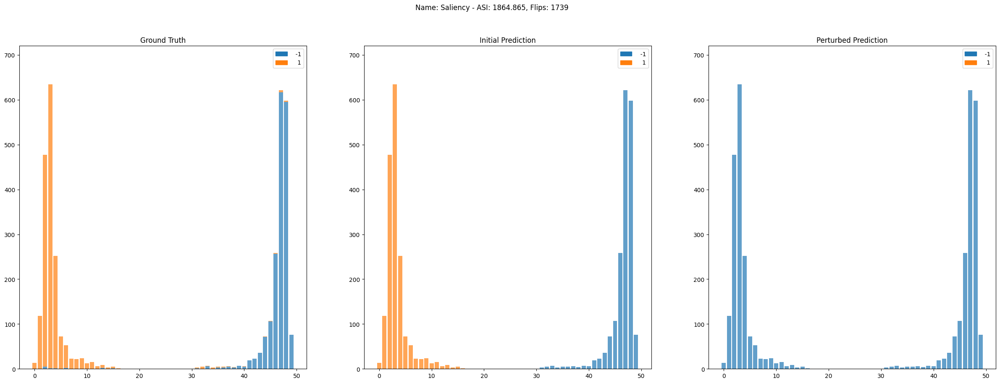

Name: GradientShap
ASI: 1942.210, Flips: 1739, Accuracy before 0.9889, after 0.5126


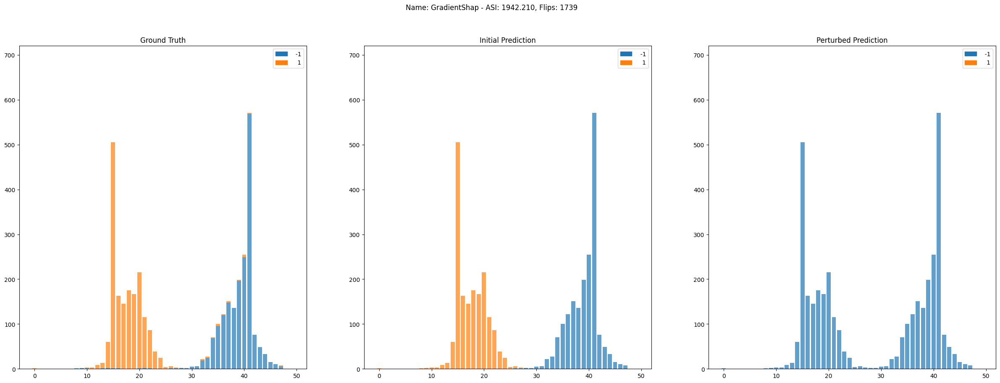

Name: DeepLift
ASI: 2072.647, Flips: 1739, Accuracy before 0.9889, after 0.5126


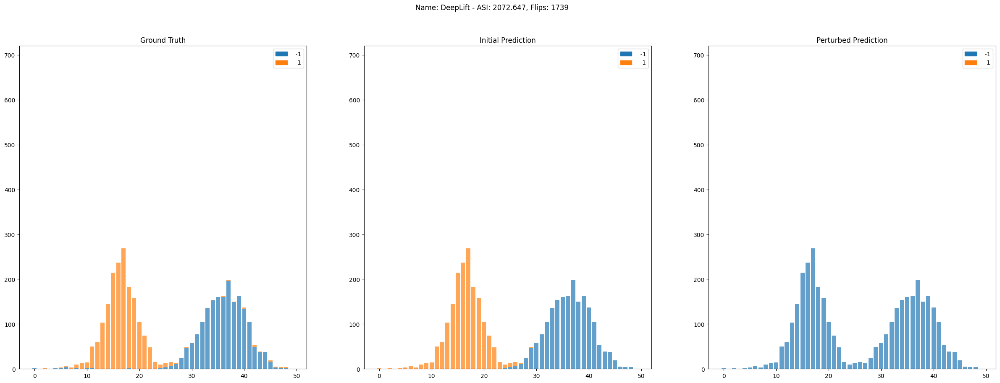

Name: DeepLiftShap
ASI: 2009.797, Flips: 1739, Accuracy before 0.9889, after 0.5126


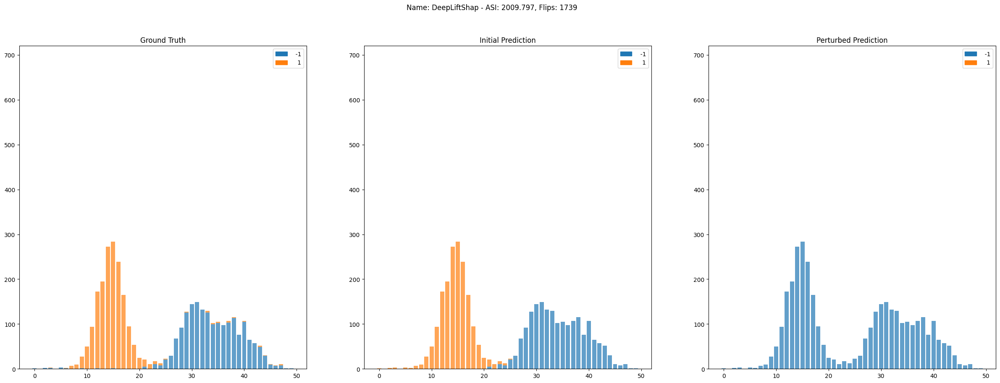

Name: IntegratedGradients
ASI: 2079.852, Flips: 1739, Accuracy before 0.9889, after 0.5126


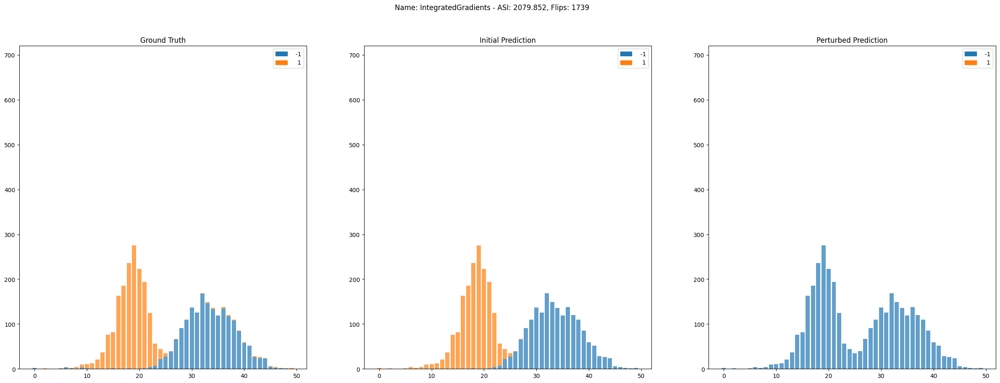

In [53]:
generate_histogram(ret_train, labels=list(np.unique(y_train)))

Name: Saliency
ASI: 1864.865, Flips: 1739


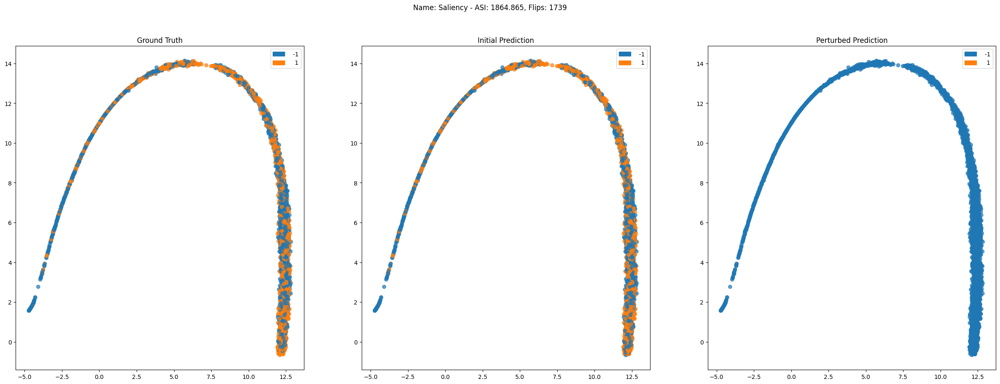

Name: GradientShap
ASI: 1942.210, Flips: 1739


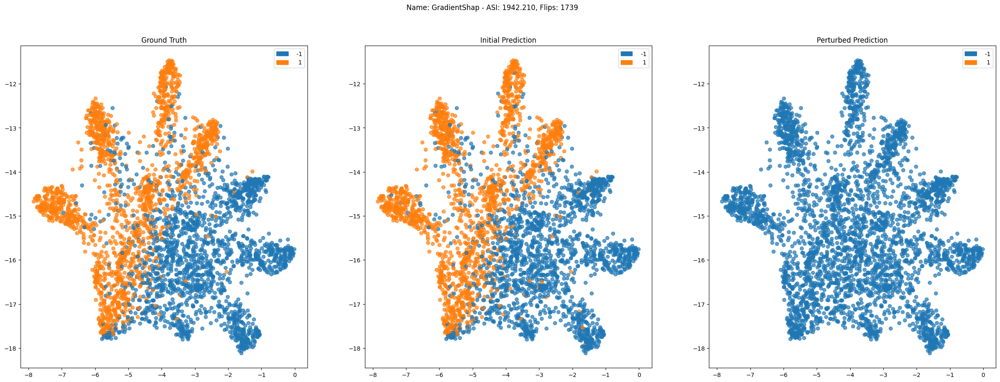

Name: DeepLift
ASI: 2072.647, Flips: 1739


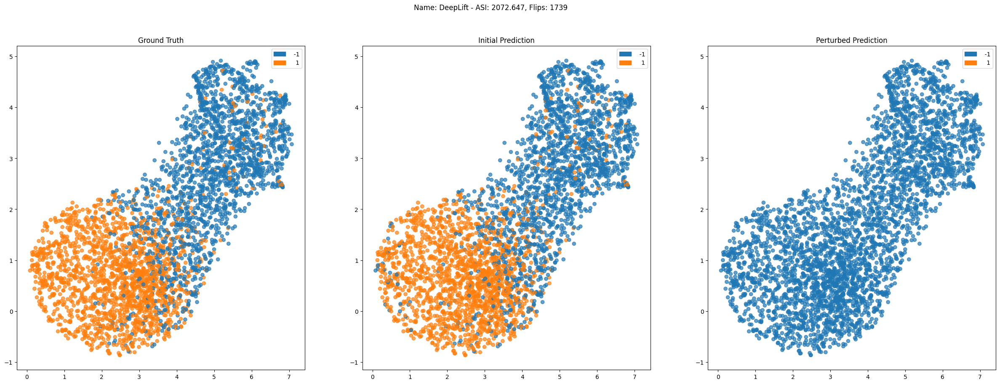

Name: DeepLiftShap
ASI: 2009.797, Flips: 1739


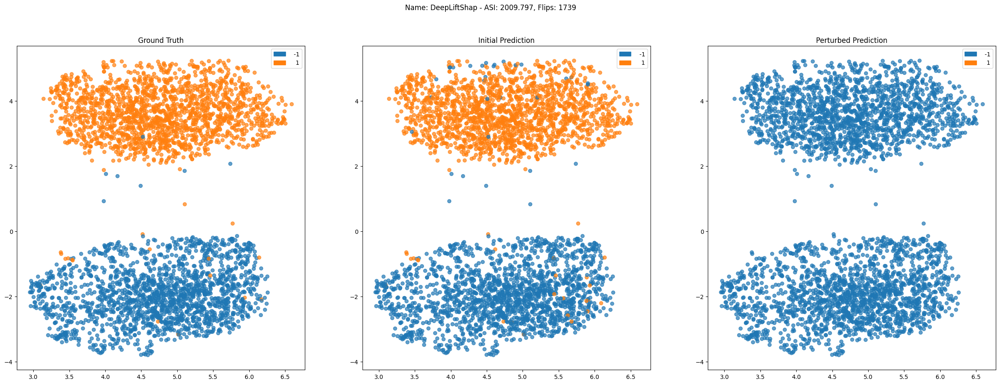

Name: IntegratedGradients
ASI: 2079.852, Flips: 1739


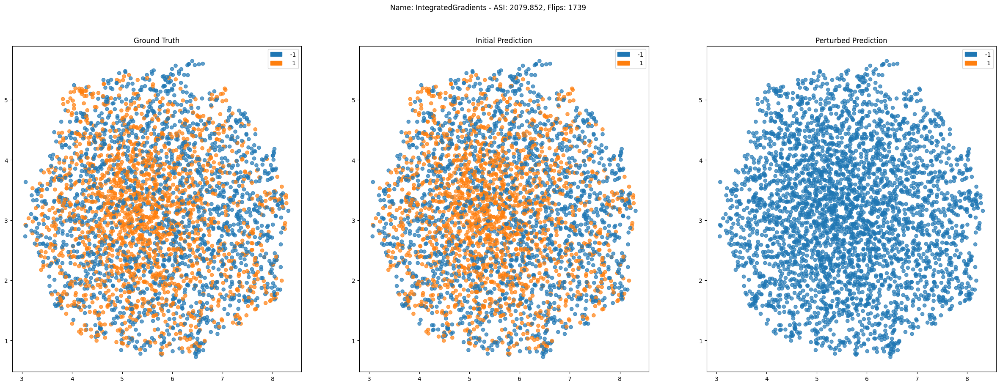

In [54]:
generate_projections(ret_train, labels=list(np.unique(y_train)))

Name: Saliency
ASI: 685.049, Flips: 611, Accuracy before 0.9121, after 0.5159


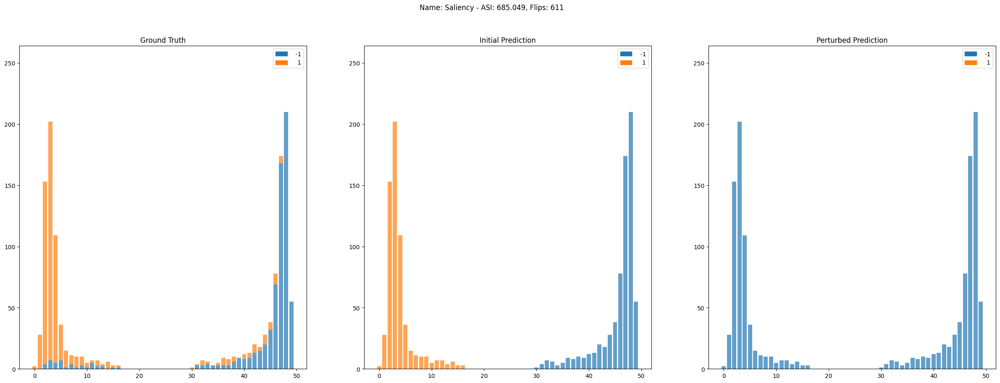

Name: GradientShap
ASI: 714.432, Flips: 611, Accuracy before 0.9121, after 0.5159


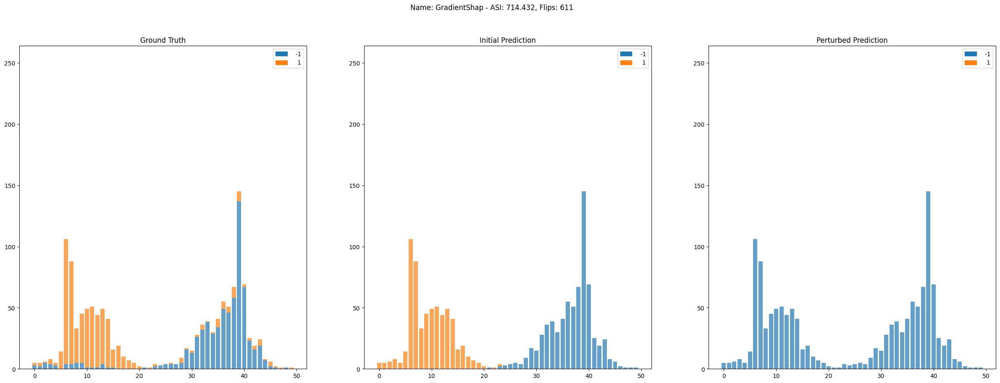

Name: DeepLift
ASI: 761.813, Flips: 611, Accuracy before 0.9121, after 0.5159


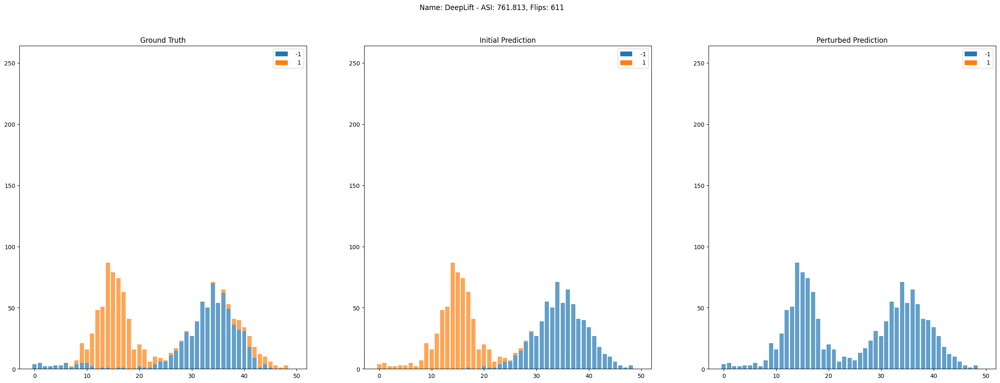

Name: DeepLiftShap
ASI: 739.009, Flips: 611, Accuracy before 0.9121, after 0.5159


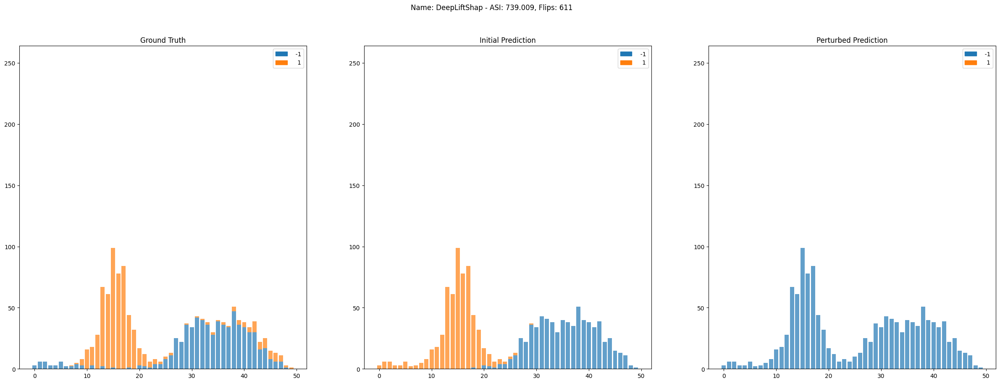

Name: IntegratedGradients
ASI: 766.577, Flips: 611, Accuracy before 0.9121, after 0.5159


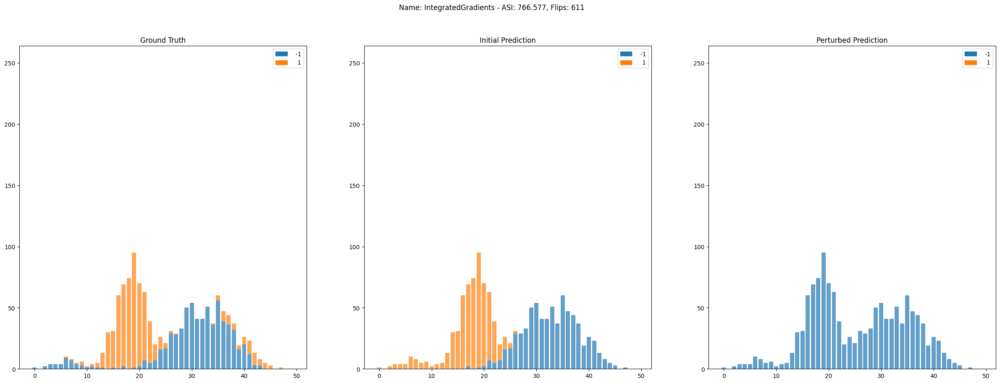

In [55]:
generate_histogram(ret_test, labels=list(np.unique(y_train)))

Name: Saliency
ASI: 685.049, Flips: 611


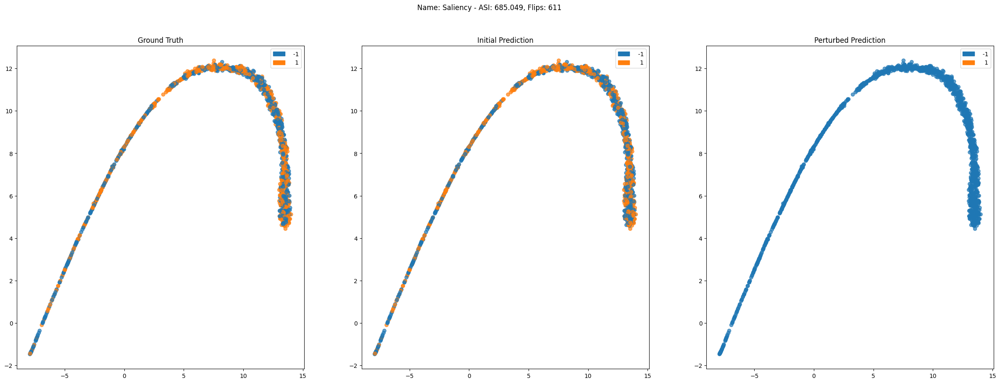

Name: GradientShap
ASI: 714.432, Flips: 611


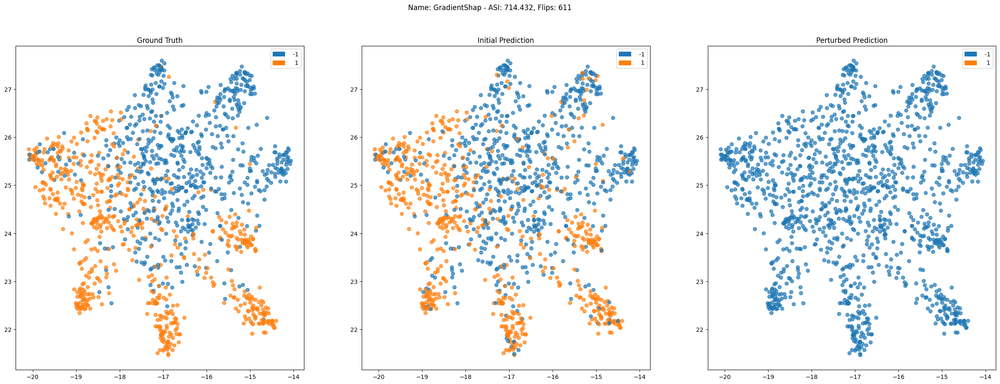

Name: DeepLift
ASI: 761.813, Flips: 611


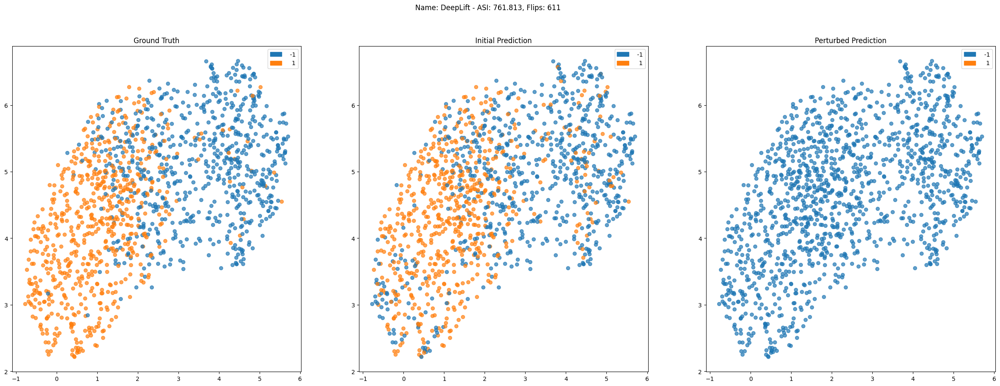

Name: DeepLiftShap
ASI: 739.009, Flips: 611


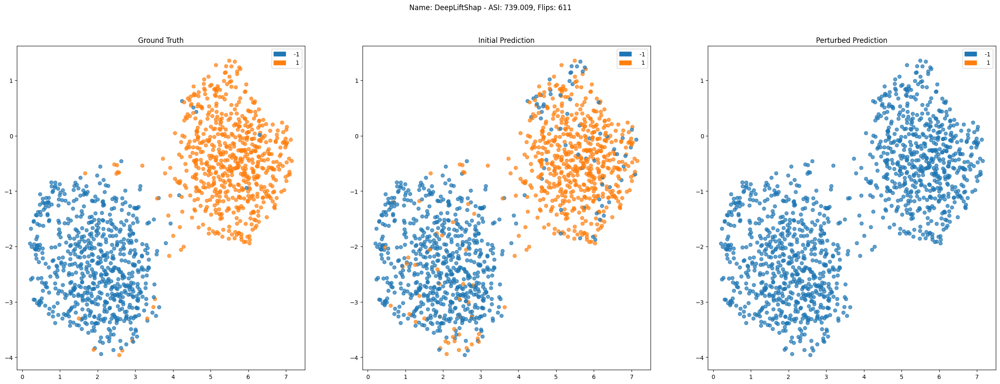

Name: IntegratedGradients
ASI: 766.577, Flips: 611


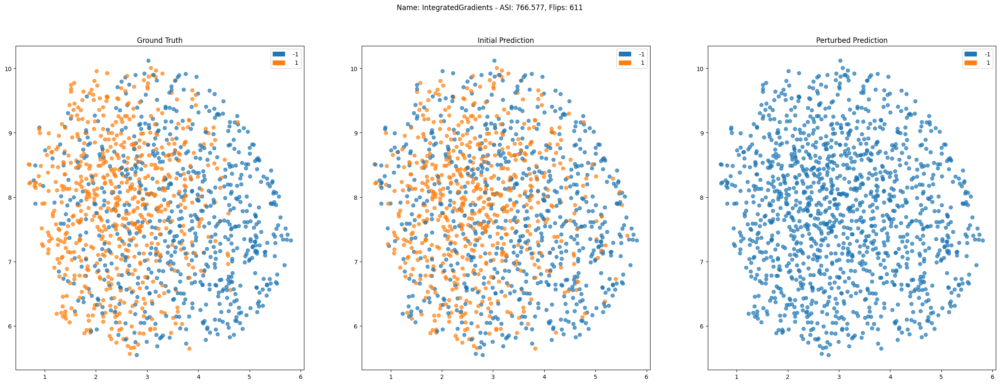

In [56]:
generate_projections(ret_test, labels=list(np.unique(y_train)))

  0%|          | 0/31 [00:00<?, ?it/s]/home/schlegel/.conda/captum/lib/python3.10/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(
/home/schlegel/.conda/captum/lib/python3.10/site-packages/captum/metrics/_utils/batching.py:50: UserWarning: `max_examples_per_batch` must be at least equal to the input batch size and at most to `input batch size` * `n_perturb_samples`.`max_examples_per_batch` is: 1 and the input batch size is: 120.This is necessary because we require that each sub-batch that is used to compute the metrics, contains at least an instance of the original example and doesn't exceed the number of expanded n_perturb_samples.
  warnings.warn(
  0%|          | 0/31 [00:00<?, ?it/s]/home/schlegel/.conda/captum/lib/python3.10/site-packages/captum/attr/_core/deep_lift.py:304: UserWarning: Setting forward, backward hooks and attributes on non-linear
               act

Name: Saliency
ASI: 0.167, Flips: 0


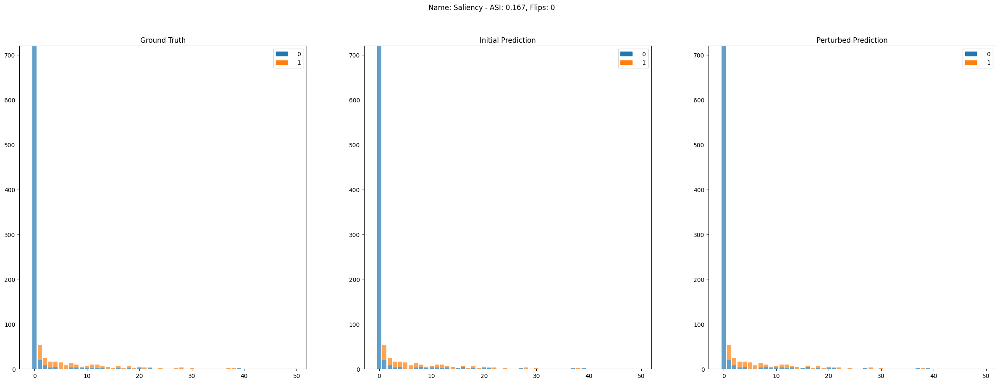

Name: GradientShap
ASI: 0.268, Flips: 0


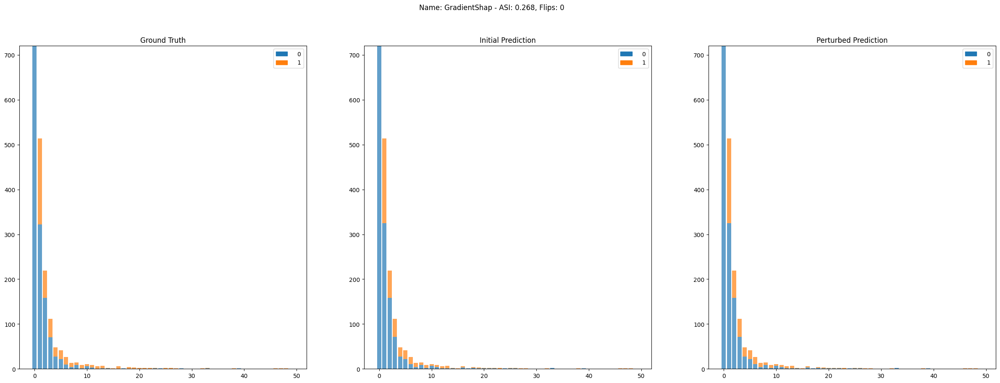

Name: DeepLift
ASI: 1.604, Flips: 0


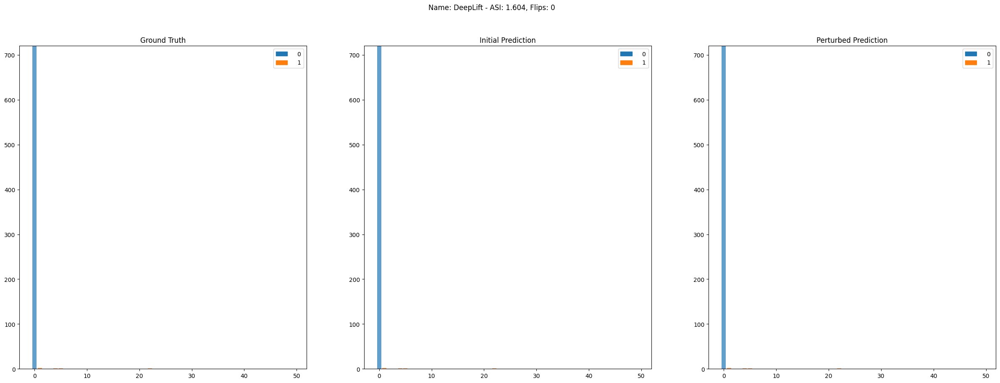

Name: DeepLiftShap
ASI: 1.495, Flips: 0


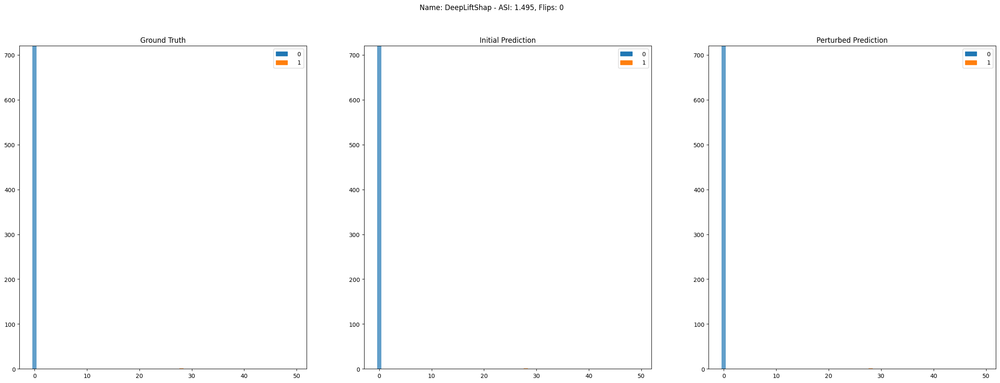

Name: IntegratedGradients
ASI: 0.216, Flips: 0


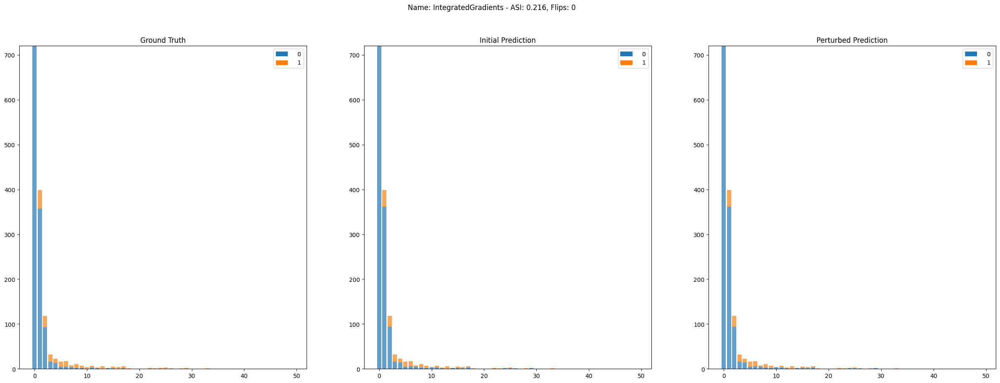

In [29]:
loader = dataloader_train_not_shuffled
t = exp_si.get_infidelity_for_dataset(loader, model, attribution_techniques)
generate_histogram(t)

100%|██████████| 11/11 [00:03<00:00,  3.44it/s]


Name: Saliency
ASI: 0.152, Flips: 0


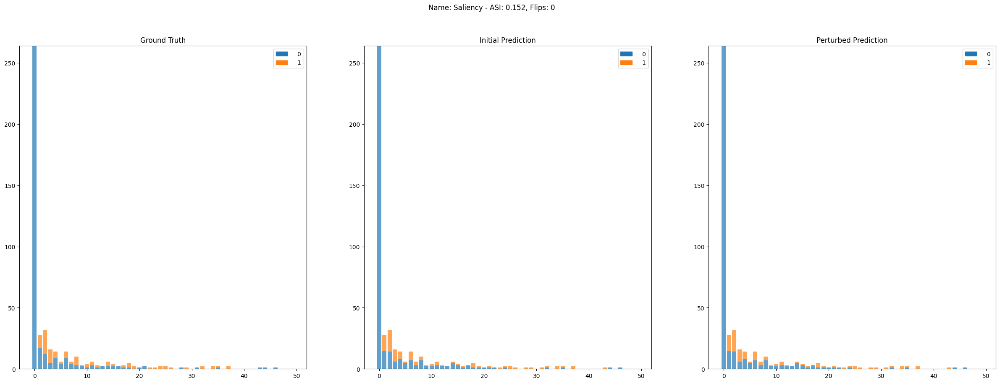

Name: GradientShap
ASI: 0.152, Flips: 0


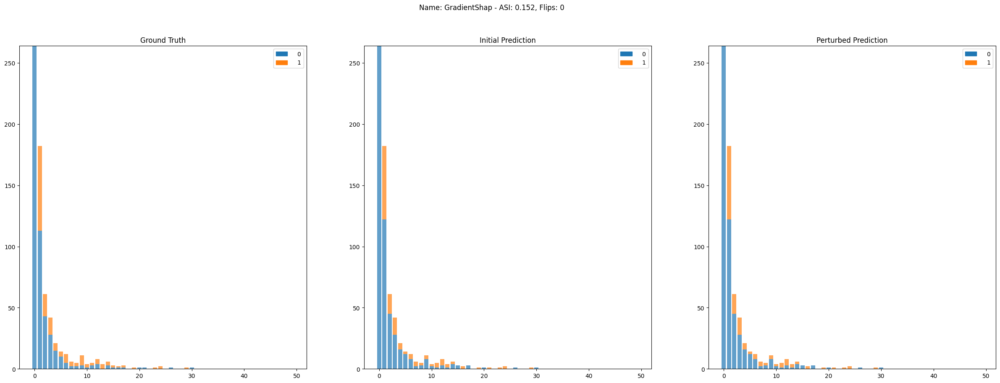

Name: DeepLift
ASI: 0.533, Flips: 0


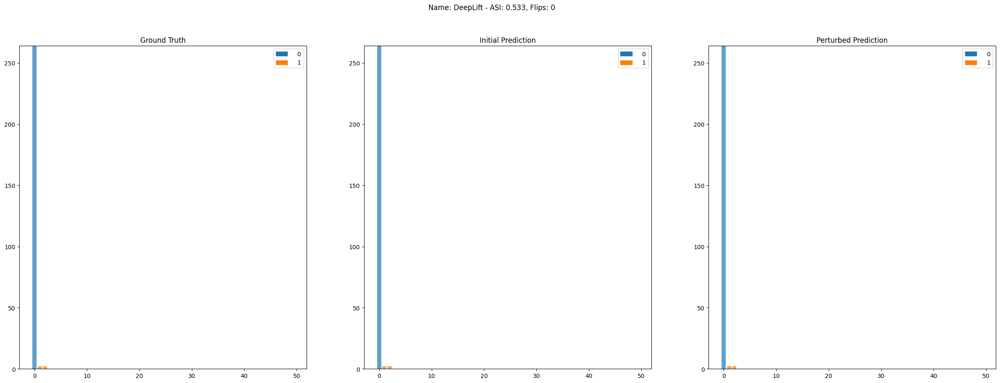

Name: DeepLiftShap
ASI: 0.107, Flips: 0


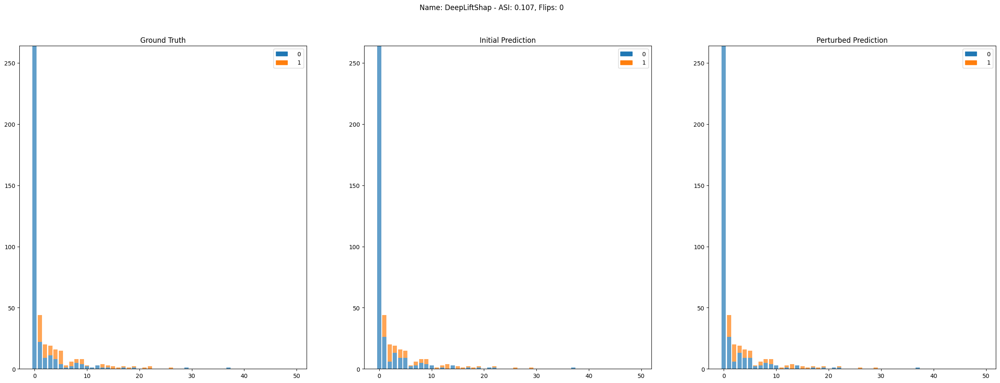

Name: IntegratedGradients
ASI: 0.138, Flips: 0


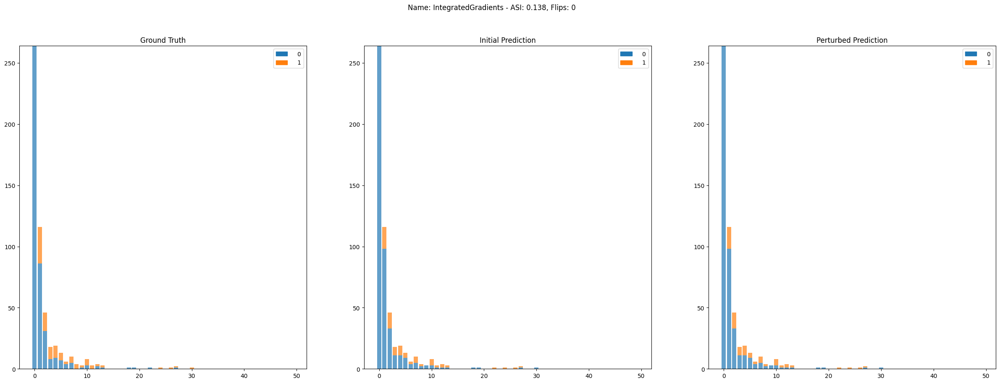

In [30]:
loader = dataloader_test
t = exp_si.get_infidelity_for_dataset(loader, model, attribution_techniques)
generate_histogram(t)

In [36]:
torch.save(model, 'models/ford-a-cnn.pth')